## Contents of this notebook:
-  1) Description of the data
-  2) listen to the different sounds, intra-class variability.
-  3) Visualization of audio signals and identification of patterns to distinguish two classes
-  4) Frequency analysis,  visualization of spectrograms, and examples of what seems to be meaw and bark patterns


In [132]:
import librosa
from matplotlib import pyplot as plt
import librosa.display
import IPython.display as ipd
import os
import audioread
from matplotlib.pyplot import specgram
import numpy as np
import pandas as pd
import re


#path for audio files folder:
relevant_path = './data/cats_dogs/'

# get files from directory and do all or a few, depending on range extracted below
sound_file_paths = [relevant_path+f for f in os.listdir(relevant_path)]
#print(sound_file_paths)

files_id=[]
pattern='(\w*_\d*).wav'
for n in sound_file_paths:
    files_id.append(re.search(pattern, n ).group(1))


#print(files_id)
n_cats=164 # number of files with cat sounds
n_dogs=113 # number of files with barking sounds    
catLabel=0
dogLabel=1

## Data Loading

In [133]:
# load data function:
# input: the path of the audio files
# Loads each audio file to a respective list depending of the file label.
# stores both number of channels and sampling rate into lists
# output: Cats and Dogs lists containing the loaded audio signals, number of channels and sampling rate lists for both cats and dogs

def load_data( files_path, sr=None): 
        
    cats = []
    cats_sr=[]
    channel_cats = []
    dogs = []
    channel_dogs = []
    dogs_sr=[]
       
    for i in range(n_cats):
       # print(files_path[i])
        cat_i, sr_i = librosa.load(files_path[i],sr=sr)
        cats.append(cat_i)
        cats_sr.append(sr_i)
        with audioread.audio_open(files_path[i]) as input_file:
            channel_cats.append(input_file.channels)
   
    for j in range(n_cats, n_cats + n_dogs):
       # print(files_path[j])
        dog_j, sr_j = librosa.load(files_path[j],sr=sr)
        dogs.append(dog_j)
        dogs_sr.append(sr_j)
        with audioread.audio_open(files_path[j]) as input_file:
            channel_dogs.append(input_file.channels)

    #channel_cats = list(channel_cats)
    #channel_dogs = list(channel_dogs)
    
    return cats, cats_sr, channel_cats, dogs, dogs_sr, channel_dogs


In [134]:
#load the files:

Cats_audio, cats_sr, channel_cats, Dogs_audio, dogs_sr, channel_dogs= load_data( sound_file_paths, sr=None)


## 1 - Data description

In [135]:
#Summary of data:

print('Number of Files per class:')
print('Cats audio files loaded: ' + str(len(Cats_audio)) + ' files')
print('Dogs audio files loaded: ' + str(len(Dogs_audio)) + ' files')
print('\n')


print('Number of Channels per class:')
cc=list(set(channel_cats))
cd=list(set(channel_dogs))
if len(cc)==1:
    print('all cat files have the same number of channels: ' + str(cc[0]) )
else: 
    print('cat files have different number of channels: ' + str(cc) )  
if len(cd)==1:
    print('all dog files have the same number of channels: ' + str(cd[0]) )
else: 
    print('dog files have different number of channels: ' + str(cd) )  
if cd!=cc:
    print("number of channels is different between cats and dogs")
else:
    n_channels=channel_cats[0]
print('\n')

print('Sampling rates per class:')
SRs_cat=list(set(cats_sr))
SRs_dog=list(set(dogs_sr))

if len(SRs_cat)==1:
    print('all cat files have the same sampling rate: ' + str(SRs_cat[0]) + ' samples per second' )
else: 
    print('cat files have different sampling rates: ' + str(SRs_cat)+' ----> should be normalized'  )  
if len(cd)==1:
    print('all dog files have the same sampling rate: ' + str(SRs_dog[0]) + ' samples per second'  )
else: 
    print('dog files have different sampling rate: ' + str(SRs_dog) + ' ----> should be normalized' )  

if SRs_cat!=SRs_dog:
    print("sample rates are different between cats and dogs files----> should be normalized")
else:
    sr=cats_sr[0]
    
print('\n')



Number of Files per class:
Cats audio files loaded: 164 files
Dogs audio files loaded: 113 files


Number of Channels per class:
all cat files have the same number of channels: 1
all dog files have the same number of channels: 1


Sampling rates per class:
all cat files have the same sampling rate: 16000 samples per second
all dog files have the same sampling rate: 16000 samples per second




In [7]:
import statistics  as st  
Sr=16000

# duration of files:
length_cats=[]
length_dogs=[]

for c in Cats_audio:
    length_cats.append(librosa.core.get_duration(y=c, sr=sr))
for d in Dogs_audio:
    length_dogs.append(librosa.core.get_duration(y=d, sr=sr))


max_length_cats=max(length_cats)
min_length_cats=min(length_cats)
av_length_cats=st.mean(length_cats)
max_length_dogs=max(length_dogs)
min_length_dogs=min(length_dogs)
av_length_dogs=st.mean(length_dogs)
print('Duration of audio files per class:')
print('the average duration of cat files is: ' + str(av_length_cats) + ' seconds')
print('the min is: ' +str(min_length_cats) + ' and the max is '+ str(max_length_cats)+ 'seconds')
print('the average duration of Dog files is: ' + str(av_length_dogs) + ' seconds')
print('the min is: ' +str(min_length_dogs) + ' and the max is '+ str(max_length_dogs)+ 'seconds')




Duration of audio files per class:
the average duration of cat files is: 8.072548399390245 seconds
the min is: 0.9233125 and the max is 17.976seconds
the average duration of Dog files is: 5.2959142699115045 seconds
the min is: 1.0156875 and the max is 17.2001875seconds


## 2 - listen to the different sounds:

In [1]:
import IPython.display as ipd
SR=16000

print('Examples of different Cats\'sounds: ')
print('\n1) Very different meows: ') 
print('cat_10')
display(ipd.Audio(filename='selected_sounds/cat_10.wav',rate=SR))
print('cat_165')
display(ipd.Audio(filename='selected_sounds/cat_165.wav',rate=SR))
print('cat_133')
display(ipd.Audio(filename='selected_sounds/cat_133.wav',rate=SR))

print('\n2) Young cat meowing: ') 
print('cat_14')
display(ipd.Audio(filename='selected_sounds/cat_14.wav',rate=SR))

print('\n3) Angry meows and hissing: ') 
print('cat_126')
display(ipd.Audio(filename='selected_sounds/cat_126.wav',rate=SR))

print('\n4) Cat purring: ') 
print('cat_89')
display(ipd.Audio(filename='selected_sounds/cat_89.wav',rate=SR))
print('cat_16')
display(ipd.Audio(filename='selected_sounds/cat_16.wav',rate=SR))

print('\n5) Several cats with overlapping meows: ') 
print('cat_84')
display(ipd.Audio(filename='selected_sounds/cat_84.wav',rate=SR))
print('cat_58')
display(ipd.Audio(filename='selected_sounds/cat_58.wav',rate=SR))

print('\n6) Noise, non_cat sounds: ') 
print('cat_1')
display(ipd.Audio(filename='selected_sounds/cat_1.wav',rate=SR))
print('cat_17')
display(ipd.Audio(filename='selected_sounds/cat_17.wav',rate=SR))

Examples of different Cats'sounds: 

1) Very different meows: 
cat_10


cat_165


cat_133



2) Young cat meowing: 
cat_14



3) Angry meows and hissing: 
cat_126



4) Cat purring: 
cat_89


cat_16



5) Several cats with overlapping meows: 
cat_84


cat_58



6) Noise, non_cat sounds: 
cat_1


cat_17


In [2]:
import IPython.display as ipd
SR=16000

print('Examples of different Dogs\'sounds: \n')
print('1) Very different barkings: ') 
print('dog_barking_7')
display(ipd.Audio(filename='selected_sounds/dog_barking_7.wav',rate=SR))
print('dog_barking_5')
display(ipd.Audio(filename='selected_sounds/dog_barking_5.wav',rate=SR))
print('dog_barking_14')
display(ipd.Audio(filename='selected_sounds/dog_barking_14.wav',rate=SR))

print('\n2) Dog howling: ') 
print('dog_barking_60')
display(ipd.Audio(filename='selected_sounds/dog_barking_60.wav',rate=SR))

print('\n3) Dog panting and whining: ') 
print('dog_barking_18')
display(ipd.Audio(filename='selected_sounds/dog_barking_18.wav',rate=SR))

print('\n4) Dog growling: ') 
print('dog_barking_5')
display(ipd.Audio(filename='selected_sounds/dog_barking_5.wav',rate=SR))

print('\n5) Several dogs with overlapping barkings: ') 
print('dog_barking_0')
display(ipd.Audio(filename='selected_sounds/dog_barking_0.wav',rate=SR))

print('\n6) Noise, non-dog sounds: ') 
print('dog_barking_108')
display(ipd.Audio(filename='selected_sounds/dog_barking_108.wav',rate=SR))

Examples of different Dogs'sounds: 

1) Very different barkings: 
dog_barking_7


dog_barking_5


dog_barking_14



2) Dog howling: 
dog_barking_60



3) Dog panting and whining: 
dog_barking_18



4) Dog growling: 
dog_barking_5



5) Several dogs with overlapping barkings: 
dog_barking_0



6) Noise, non-dog sounds: 
dog_barking_108


## 3 - Visualization audio signals

Showing waves for Cats:


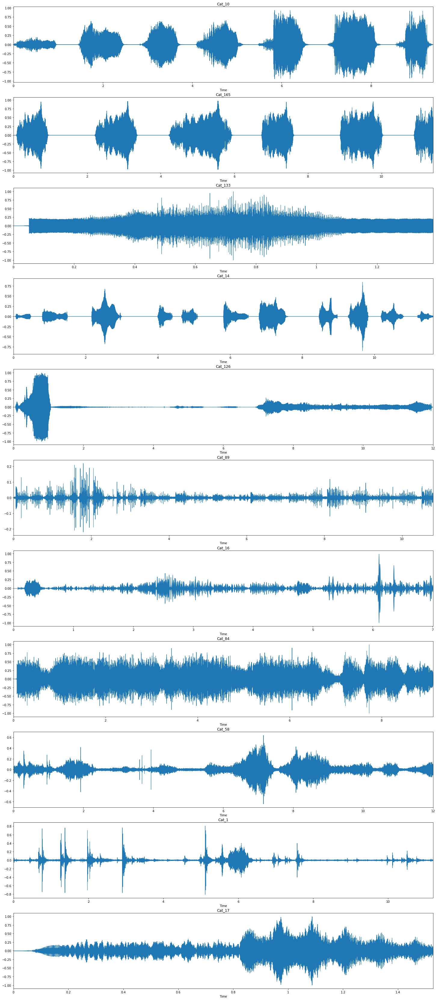

Showing waves for Dogs:


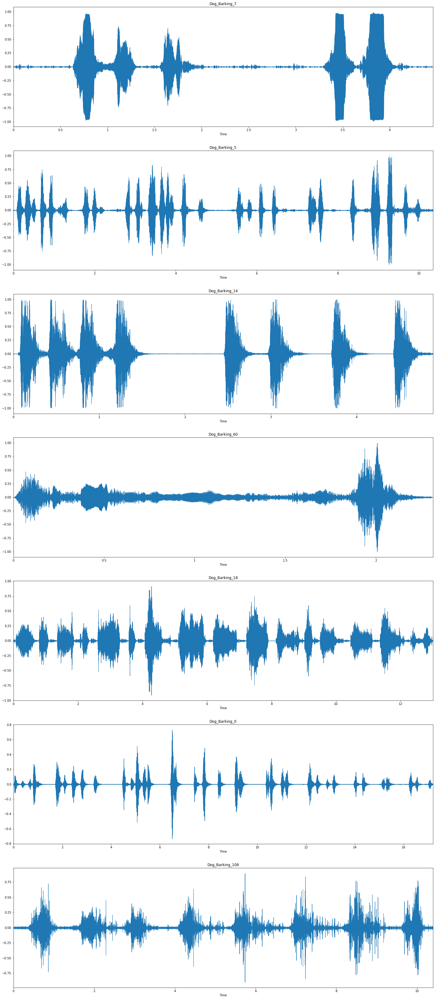

In [222]:

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(len(sound_names),1,i)
        librosa.display.waveplot(np.array(f),sr=SR, x_axis='time')
        plt.title(n.title())
        i += 1        
    plt.show()


# plot some representative audios for cats and dogs:

catsfiles_id_toplot=['cat_10','cat_165', 'cat_133','cat_14','cat_126','cat_89', 'cat_16','cat_84','cat_58','cat_1', 'cat_17']
index_cats=[files_id.index(i) for i in catsfiles_id_toplot]
Cats_audio_toplot=[Cats_audio[ix] for ix in index_cats]

print('Showing waves for Cats:')
plot_waves(catsfiles_id_toplot,Cats_audio_toplot  )

dogsfiles_id_toplot=['dog_barking_7', 'dog_barking_5','dog_barking_14','dog_barking_60','dog_barking_18','dog_barking_0','dog_barking_108']
index_dogs=[files_id.index(i)-n_cats for i in dogsfiles_id_toplot]
dogs_audio_toplot=[Dogs_audio[ix] for ix in index_dogs]

print('Showing waves for Dogs:')
plot_waves(dogsfiles_id_toplot, dogs_audio_toplot)



## 3) Frequency analysis

In [250]:
# Analysis in frequency!

# plot spectograms  and mel spectrograms
# isolate interesting patterns.
# check energy values and its distribution regarding frequencies!

from matplotlib.pyplot import specgram
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(15,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(len(sound_names),1,i)
        d=librosa.core.stft(f)
        #specgram(np.array(f), Fs=22050)
        librosa.display.specshow(librosa.amplitude_to_db(d,ref=np.max), y_axis='log', x_axis='time')
        plt.title(n.title())
        i += 1
    plt.show()



# extract mel_spectograms:
# Compute_mel_frequencies function:
# Computes the Mel-scaled spectrograms for each audio file
# input: lists of raw audio for cats and dogs, and sampling rate
#output: melspectograms for each file, in a list per class
def compute_mel_frequencies(cats,dogs, sr ):
    cats_mel_frequencies = []
    dogs_mel_frequencies = []
    
    for c in cats:
        cats_mel_frequencies.append(librosa.feature.melspectrogram(y=c,sr=sr))
    for d in dogs:
        dogs_mel_frequencies.append(librosa.feature.melspectrogram(y=d,sr=sr))
        
    return cats_mel_frequencies,dogs_mel_frequencies

def plot_mel_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(15,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(len(sound_names),1,i)
        S = librosa.feature.melspectrogram(f, sr=SR, n_mels=128)
        melogram=librosa.power_to_db(S, ref=np.max)
        librosa.display.specshow(melogram, y_axis='mel')
        plt.title(n.title())
        i += 1
    plt.show()
    
    

def compute_MEL_deltas(cats_mel_frequencies,dogs_mel_frequencies):
    cats_mel_deltas = []
    dogs_dogs_deltas = []
    
    for i in range(164):
        cats_mel_deltas.append(librosa.feature.delta(cats_mel_frequencies[i]))
    for i in range(113):
        dogs_dogs_deltas.append(librosa.feature.delta(dogs_mel_frequencies[i]))
   
    return cats_mel_deltas, dogs_dogs_deltas

def plot_mel_deltas(sound_names, raw_sounds):
    i = 1
    fig = plt.figure(figsize=(15,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(len(sound_names),1,i)
        S = librosa.feature.melspectrogram(f, sr=SR, n_mels=128)
        melogram=librosa.power_to_db(S, ref=np.max)
        #
        mel_delta = librosa.feature.delta(melogram)
        librosa.display.specshow(mel_delta)
        plt.title(n.title())
        i += 1
    plt.show()

# extract MFCCs:
def compute_mfccs(cats_mel_frequencies,dogs_mel_frequencies,sr=22050):
    cats_mfccs = []
    dogs_mfccs = []
    
    for i in range(n_cats):
        cats_mfccs.append(librosa.feature.mfcc(S=librosa.power_to_db(cats_mel_frequencies[i]),sr=sr))
    for i in range(n_dogs):
        dogs_mfccs.append(librosa.feature.mfcc(S=librosa.power_to_db(dogs_mel_frequencies[i]),sr=sr))
        
    return cats_mfccs,dogs_mfccs

def plot_mfcc(sound_names,sounds_mfccs):
    i = 1
    fig = plt.figure(figsize=(10,20))
    for n,f in zip(sound_names,sounds_mfccs):
        plt.subplot(len(sound_names),1,i)
        librosa.display.specshow(f, x_axis='time')
        plt.title(n.title())
        plt.colorbar()
        plt.tight_layout()
        i += 1
    plt.show()

def compute_MFCC_deltas(cats_mfccs,dogs_mfccs):
    cats_deltas = []
    dogs_deltas = []
    
    for i in range(164):
        cats_deltas.append(librosa.feature.delta(cats_mfccs[i]))
    for i in range(113):
        dogs_deltas.append(librosa.feature.delta(dogs_mfccs[i]))
        
    return cats_deltas,dogs_deltas

Showing spectrograms for Cats:


c:\users\ines\appdata\local\programs\python\python36\lib\site-packages\librosa\core\spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


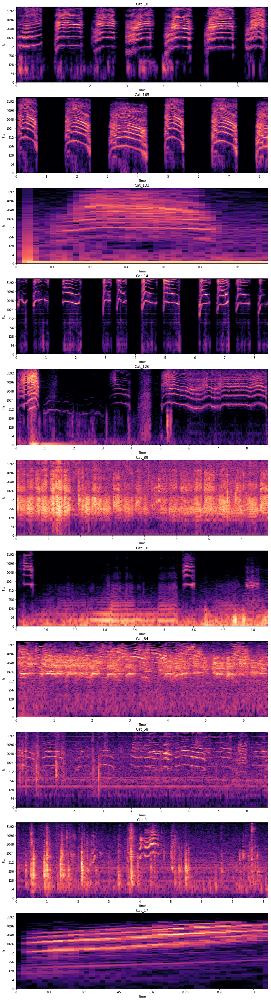

Showing spectrograms for Dogs:


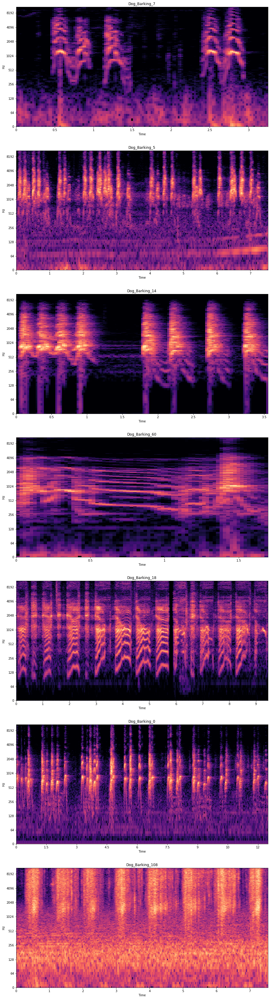

In [238]:
#spectrograms, 

print('Showing spectrograms for Cats:')
plot_specgram(catsfiles_id_toplot,Cats_audio_toplot)
print('Showing spectrograms for Dogs:')
plot_specgram(dogsfiles_id_toplot, dogs_audio_toplot)

Showing Melspectrograms for Cats:


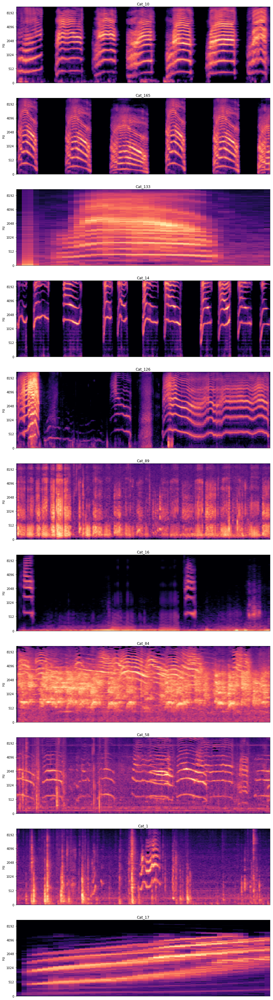

Showing Melspectrograms for Dogs:


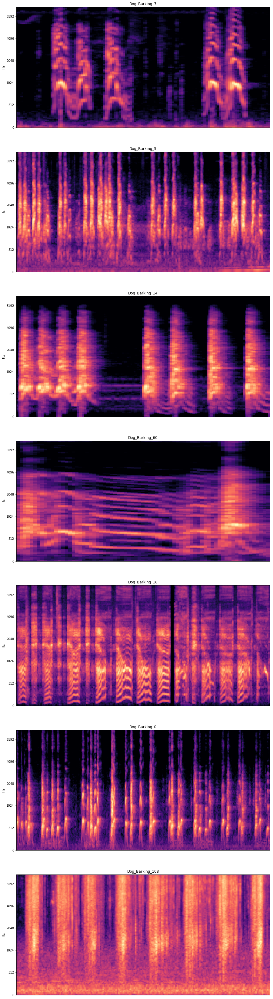

In [251]:
print('Showing Melspectrograms for Cats:')
plot_mel_specgram(catsfiles_id_toplot,Cats_audio_toplot)
print('Showing Melspectrograms for Dogs:')
plot_mel_specgram(dogsfiles_id_toplot, dogs_audio_toplot)

Showing Delta-Melspectrograms for Cats:


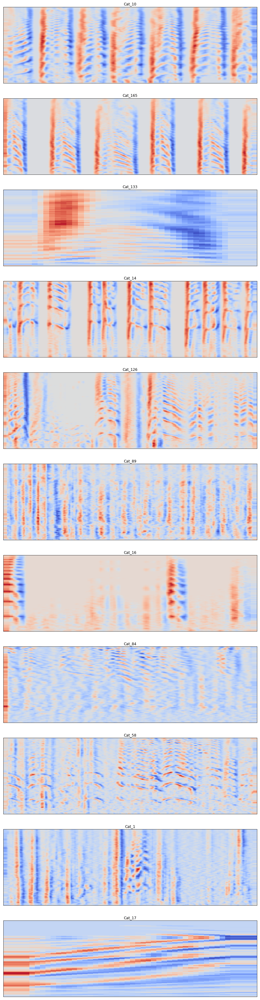

Showing Delta_Melspectrograms for Dogs:


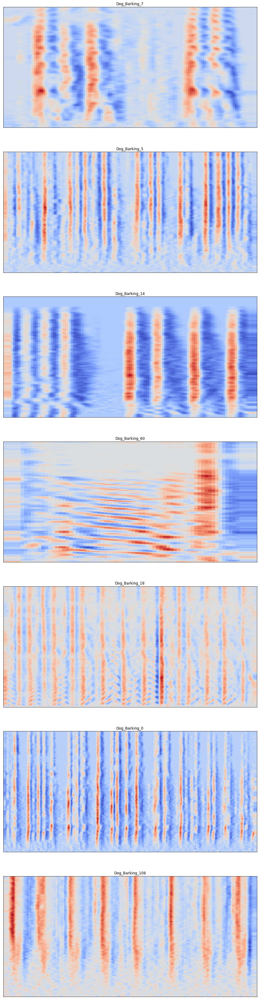

In [247]:

print('Showing Delta-Melspectrograms for Cats:')
plot_mel_deltas(catsfiles_id_toplot,Cats_audio_toplot)
print('Showing Delta_Melspectrograms for Dogs:')
plot_mel_deltas(dogsfiles_id_toplot, dogs_audio_toplot)

Showing MFCCs for Cats:


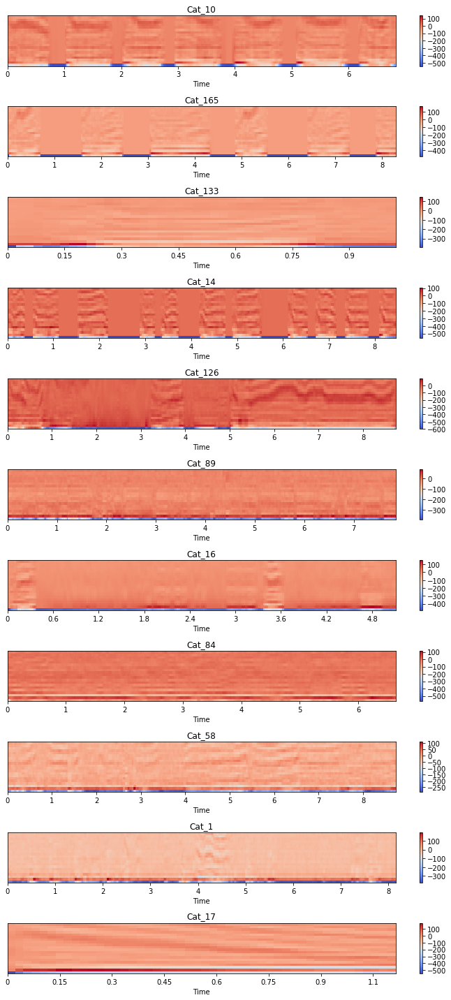

Showing MFCCs for Dogs:


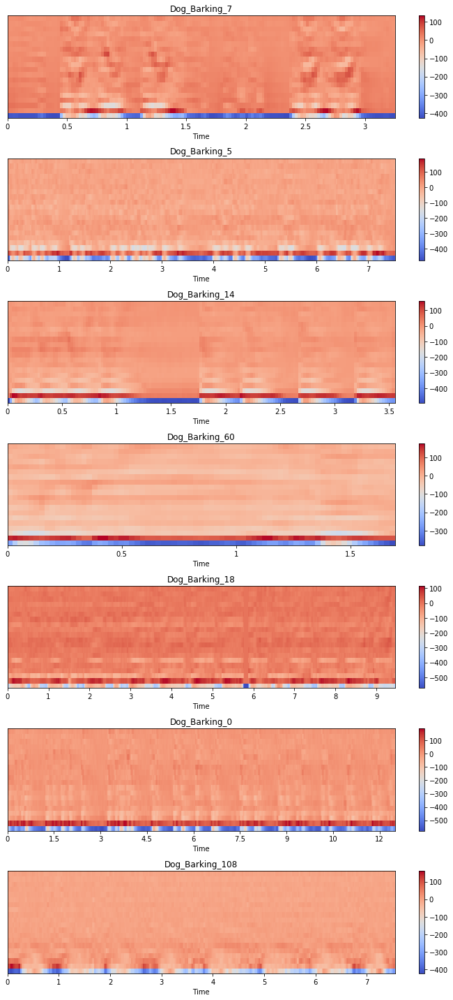

In [241]:
cats_mfccs, dogs_mfccs= compute_mfccs(cats_mel_frequencies,dogs_mel_frequencies,sr)

Cats_mfcc_toplot=[cats_mfccs[ix] for ix in index_cats]
dogs_mfcc_toplot=[dogs_mfccs[ix] for ix in index_dogs]
print('Showing MFCCs for Cats:')
plot_mfcc(catsfiles_id_toplot,Cats_mfcc_toplot)
print('Showing MFCCs for Dogs:')
plot_mfcc(dogsfiles_id_toplot, dogs_mfcc_toplot)
